In [1]:
import os
import glob
import pickle
import random

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('notebook')
import pandas as pd
import numpy as np
from PIL import Image
from scipy import stats
import umap

In [2]:
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA

In [3]:
from sklearn.datasets import make_friedman2
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel, RBF, Matern

In [4]:
def show_galaxies(df):
    fig, axes = plt.subplots(6, 6, figsize=(20, 20))
    all_axes = [ax for row in axes for ax in row]
    for ax_n, ax in enumerate(all_axes):
        ax.imshow(np.array(Image.open(df.iloc[ax_n]['filename'])))
        ax.axis('off')

## 1D Test

In [6]:


X = np.array([-2, -1, -.5, 4, 5, 6]).reshape(-1, 1)
y = np.array([-1, -0.5, 0, 0.5, 1., 1.5]).reshape(-1, 1)

kernel = DotProduct() + WhiteKernel()
gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X, y)

In [7]:
gpr.score(X, y)

0.9212613914448308

In [8]:
X_test = np.linspace(-2., 6.).reshape(-1, 1)
preds, stds = gpr.predict(X_test, return_std=True)

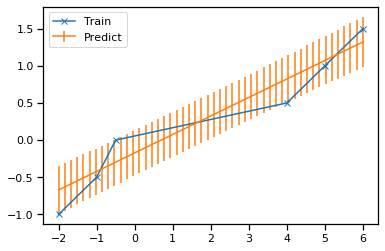

In [9]:
plt.plot(X, y, label='Train', marker='x')
plt.errorbar(X_test, preds, yerr=stds, label='Predict')

# n_samples = 100
# samples = gpr.sample_y(X_test, n_samples=n_samples)
# print(samples.shape)

# plt.scatter(np.stack([X_test] * n_samples), samples.squeeze(), alpha=.1)
plt.legend()

## 2D Test

In [7]:
feature_df = pd.read_parquet('dr5_8_b0_pca2_and_safe_ids.parquet')

In [8]:
feature_cols = [col for col in feature_df.columns.values if col.startswith('feat_')]
pca_2 = feature_df[feature_cols].values

In [41]:
def mean_with_noise(X):
    return X.mean(axis=1) + np.random.rand(len(X))

In [42]:
def gaussian_with_noise(X):
    mean = [0.5, 0]
    var = [1., 1.]
    dist = stats.multivariate_normal(mean=mean, cov=var)
    return dist.pdf(X) + 0.1 * np.random.rand(len(X))

In [43]:
X.shape

(2000, 2)

In [44]:
X = pca_2[:2000]
# y = mean_with_noise(X)
y = gaussian_with_noise(X)

# kernel = DotProduct() + WhiteKernel()
# https://scikit-learn.org/stable/modules/gaussian_process.html#basic-kernels
# kernel = RBF() + WhiteKernel()  #  mean square derivatives of all orders, and are thus very smooth
kernel = Matern() + WhiteKernel()  #  additional parameter which controls the smoothness

gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X, y)
gpr.score(X, y)

0.7119056202663687

In [45]:
preds = gpr.predict(X)

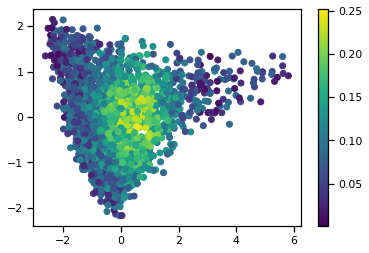

In [46]:
plt.scatter(X[:, 0], X[:, 1], c=np.squeeze(y), cmap='viridis')
plt.colorbar()

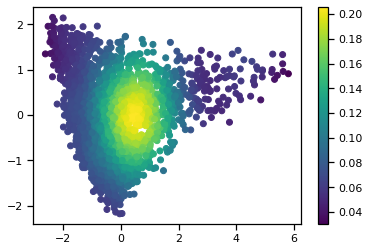

In [47]:
plt.scatter(X[:, 0], X[:, 1], c=preds, cmap='viridis')
plt.colorbar()

## 2D Uncertainty Sampling

In [9]:
from modAL.models import ActiveLearner

In [49]:
def GP_regression_std(regressor, X):
    # many more strategies available
    _, std = regressor.predict(X, return_std=True)
    query_idx = np.argmax(std)
    return query_idx, X[query_idx]

In [50]:
y = gaussian_with_noise(X).reshape(-1, 1)

X_training = X[:10]
y_training = y[:10]

X_pool = X[10:]
y_pool = y[10:]



In [51]:
kernel = RBF() + WhiteKernel()

regressor = ActiveLearner(
    estimator=GaussianProcessRegressor(kernel=kernel),
    query_strategy=GP_regression_std,
    X_training=X_training, y_training=y_training
)

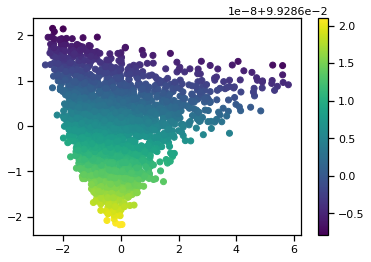

In [52]:
plt.scatter(X[:, 0], X[:, 1], c=np.squeeze(regressor.predict(X)), cmap='viridis')
plt.colorbar()

In [53]:
X_pool[0]

array([0.54620164, 1.0862788 ])

In [54]:
y_pool[0]

array([0.15008821])

In [55]:
n_queries = 10
for idx in range(n_queries):
    query_idx, query_instance = regressor.query(X_pool)
    regressor.teach(X_pool[query_idx].reshape(1, -1), y_pool[query_idx].reshape(1, -1))

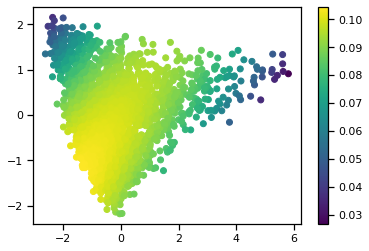

In [56]:
plt.scatter(X[:, 0], X[:, 1], c=np.squeeze(regressor.predict(X)), cmap='viridis')
plt.colorbar()

/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/sklearn/gaussian_process/_gpr.py:494: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


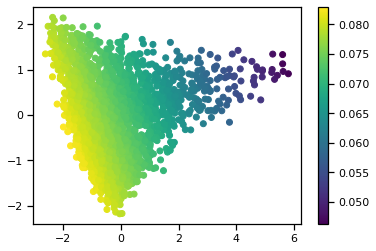

In [57]:
n_queries = 100
for idx in range(n_queries):
    query_idx, query_instance = regressor.query(X_pool)
    regressor.teach(X_pool[query_idx].reshape(1, -1), y_pool[query_idx].reshape(1, -1))
    
plt.scatter(X[:, 0], X[:, 1], c=np.squeeze(regressor.predict(X)), cmap='viridis')
plt.colorbar()

In [58]:
regressor.estimator.score(X, y)

-0.5526902510070804

-0.018262541455729364


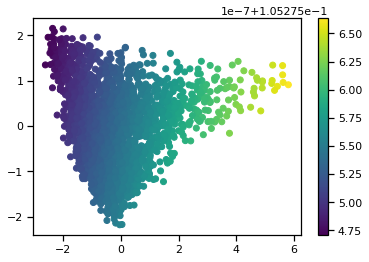

In [59]:
random_indices = np.arange(len(X))
random.shuffle(random_indices)
random_queries = random_indices[:110]

random_regressor = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X[random_queries], y[random_queries])
print(random_regressor.score(X, y))
plt.scatter(X[:, 0], X[:, 1], c=np.squeeze(random_regressor.predict(X)), cmap='viridis')
plt.colorbar()

In [60]:
feature_df

,galaxy_id,feat_0_pca,feat_1_pca
0,J000001.03+003228.7,-0.554547,-0.593720
1,J000001.55-000533.3,-0.541485,1.176928
2,J000001.85+004309.3,-0.477997,0.804125
3,J000002.29-042805.0,-0.740163,-1.516806
4,J000002.70+081756.0,2.045165,0.825714
...,...,...,...
911437,99997_707,1.992261,0.111996
911438,99998_3298,-0.706641,0.099509
911439,99999_396,-1.481122,1.077464
911440,99999_3961,-0.022300,-0.458920


look at folder, copy best galaxies out somewhere, use that as training and test random vs active learning selection to reproduce my interests

In [47]:
def get_label_df(base_folder, iaunames):
    
    assert os.path.isdir(base_folder)
    
    interesting_paths = glob.glob(os.path.join(base_folder, 'interesting/*.png'))
    not_interesting_paths = glob.glob(os.path.join(base_folder, 'not_interesting/*.png'))
    
    if not len(interesting_paths) > 0:
        raise ValueError(os.path.join(base_folder, 'interesting/*.png'))
    if not len(interesting_paths) > 0:
        raise ValueError(os.path.join(base_folder, 'not_interesting/*.png'))
    
    interesting_names = [os.path.basename(x).replace('.png', '') for x in interesting_paths]
    not_interesting_names = [os.path.basename(x).replace('.png', '') for x in not_interesting_paths]
    
    interesting = np.array(pd.Series(iaunames).isin(interesting_names))
    not_interesting = np.array(pd.Series(iaunames).isin(not_interesting_names))

    df = pd.DataFrame(data={'galaxy_id': iaunames,'interesting':interesting, 'not_interesting': not_interesting})
    
    df['filename'] = ['/media/walml/beta1/decals/png_native/dr5/' + x[:4] + '/' + x + '.png' for x in iaunames]
    
    df['labelled'] = df['interesting'] | df['not_interesting']
    print(df['labelled'].sum(), len(df))
    
    return df

In [48]:
df = get_label_df('/home/walml/repos/astronomaly/labels', feature_df['galaxy_id'])

1194 10000


In [49]:
df.head()

,galaxy_id,interesting,not_interesting,filename,labelled
0,J000001.03+003228.7,False,True,/media/walml/beta1/decals/png_native/dr5/J000/...,True
1,J000001.55-000533.3,False,True,/media/walml/beta1/decals/png_native/dr5/J000/...,True
2,J000001.85+004309.3,False,True,/media/walml/beta1/decals/png_native/dr5/J000/...,True
3,J000002.29-042805.0,True,False,/media/walml/beta1/decals/png_native/dr5/J000/...,True
4,J000002.70+081756.0,False,True,/media/walml/beta1/decals/png_native/dr5/J000/...,True


In [52]:
df.to_csv('embedding_index_and_labels_911k.csv', index=False)

In [34]:
# 1 if labelled, 0 if not, nan otherwise
# df['proxy_label'] = df['labelled']

In [66]:
df_X = df[:2000]  # index matches X

labelled = df_X['labelled']
X_labelled = X[labelled]

X_interesting = df_X['interesting']
X_not_interesting = df_X['not_interesting']

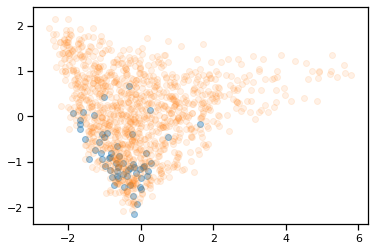

In [67]:
# plt.scatter(X[:, 0], X[:, 1], alpha=.1,  cmap='viridis')
plt.scatter(X[X_interesting, 0], X[X_interesting, 1], alpha=.4,  cmap='viridis')
plt.scatter(X[X_not_interesting, 0], X[X_not_interesting, 1], alpha=.1,  cmap='viridis')
# plt.scatter(X[~not_interesting & ~interesting, 0], X[~not_interesting & ~interesting, 1], alpha=.1,  cmap='viridis')

In [68]:
X_labelled

labels = np.array(df_X['interesting'].astype(int) - df_X['not_interesting'].astype(int))[labelled]

In [69]:
pd.value_counts(labels)

-1    1136
 1      58
dtype: int64

In [70]:
len(X_labelled)

1194

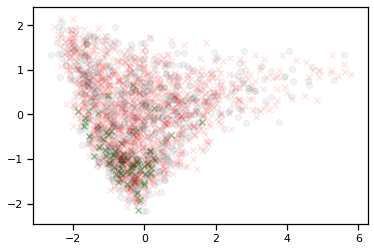

In [71]:
X_labelled_yes = X_labelled[labels == 1]
X_labelled_no = X_labelled[labels == -1]
X_not_labelled = X[~df_X['interesting'] & ~df_X['not_interesting']]

plt.scatter(X_labelled_yes[:, 0], X_labelled_yes[:, 1], alpha=.4,  color='g', marker='x')
plt.scatter(X_labelled_no[:, 0], X_labelled_no[:, 1], alpha=.1,  color='r', marker='x')
plt.scatter(X_not_labelled[:, 0], X_not_labelled[:, 1], alpha=.05,  color='k')

In [72]:

kernel = Matern() + WhiteKernel()  #  additional parameter which controls the smoothness

gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X_labelled, labels)
gpr.score(X_labelled, labels)


0.078114263111706

In [73]:
preds, std = gpr.predict(X, return_std=True)


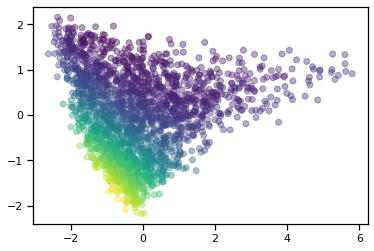

In [74]:
plt.scatter(X[:, 0], X[:, 1], c=preds, alpha=.4,  cmap='viridis')

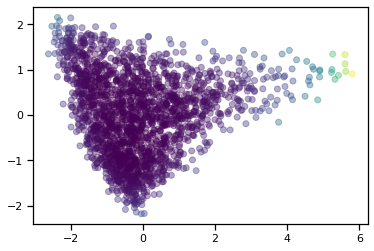

In [75]:
plt.scatter(X[:, 0], X[:, 1], c=std, alpha=.4,  cmap='viridis')

In [76]:
df_X['gp_pred'] = preds
df_X['gp_std'] = std

/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


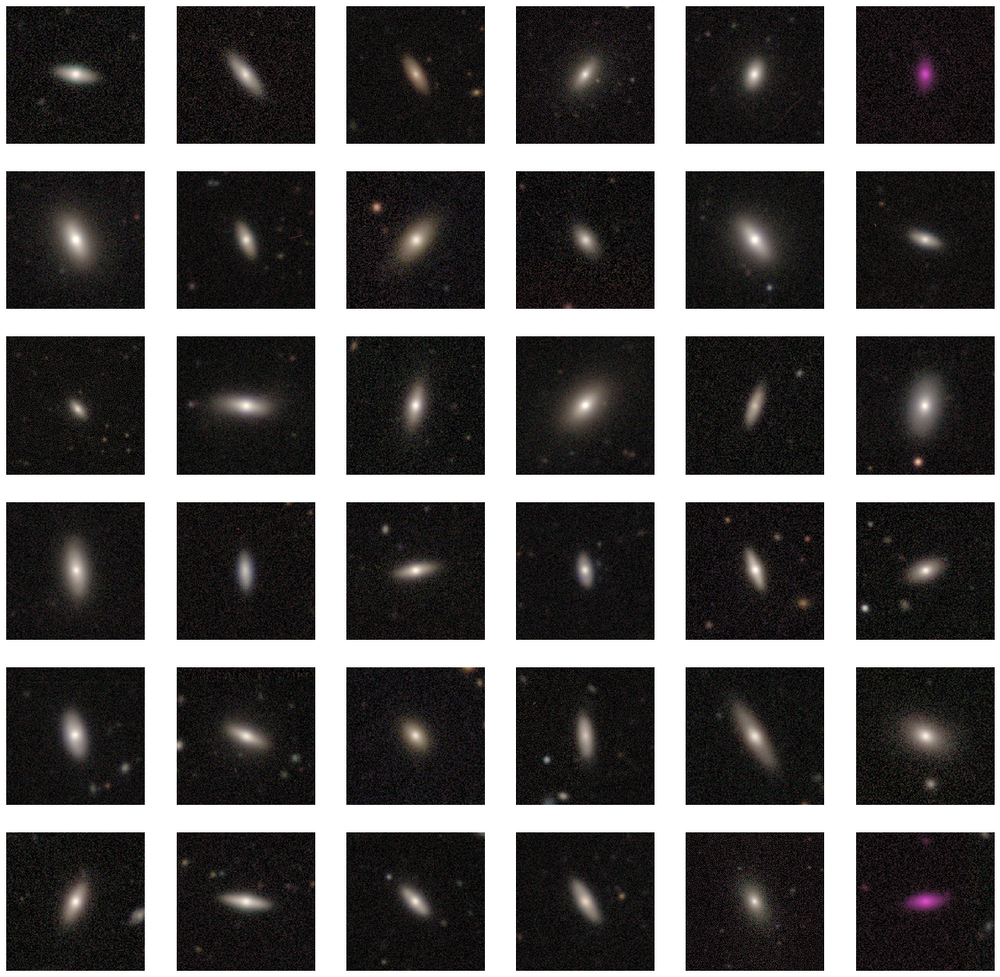

In [77]:
show_galaxies(df_X.sort_values('gp_pred'))

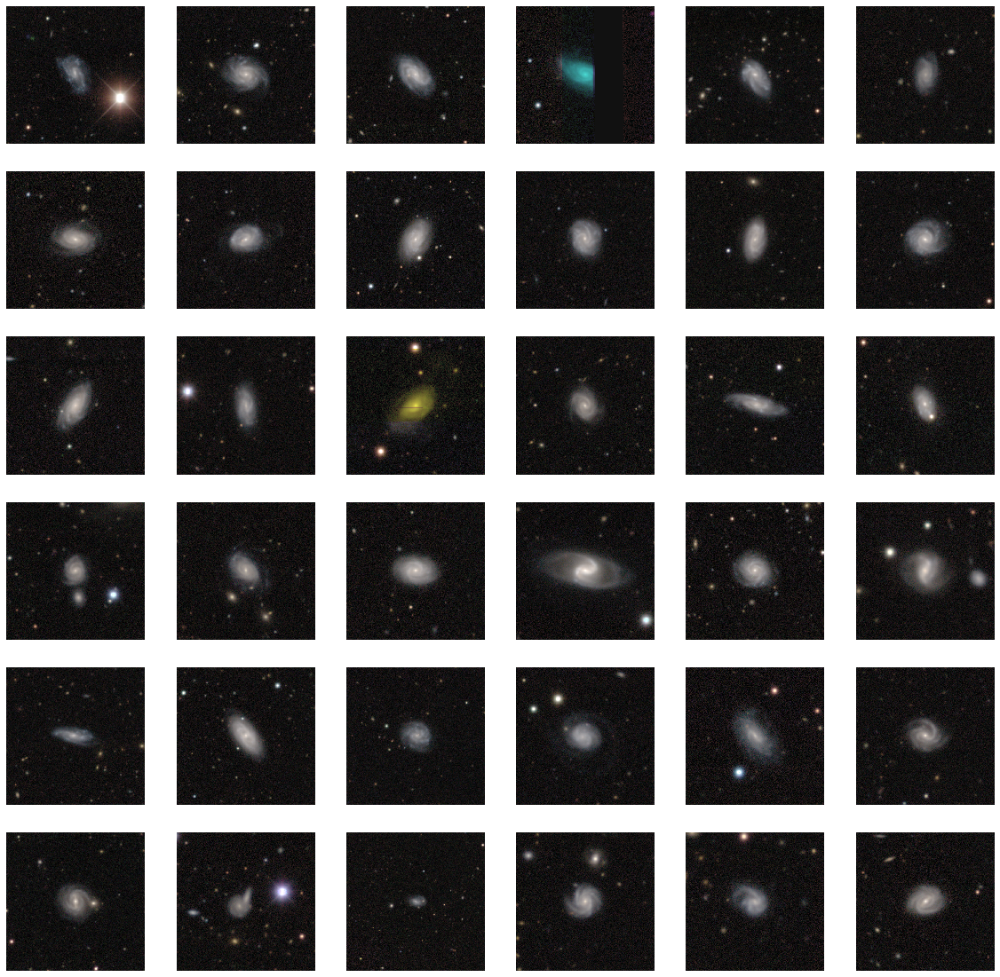

In [78]:
show_galaxies(df_X.sort_values('gp_pred', ascending=False))

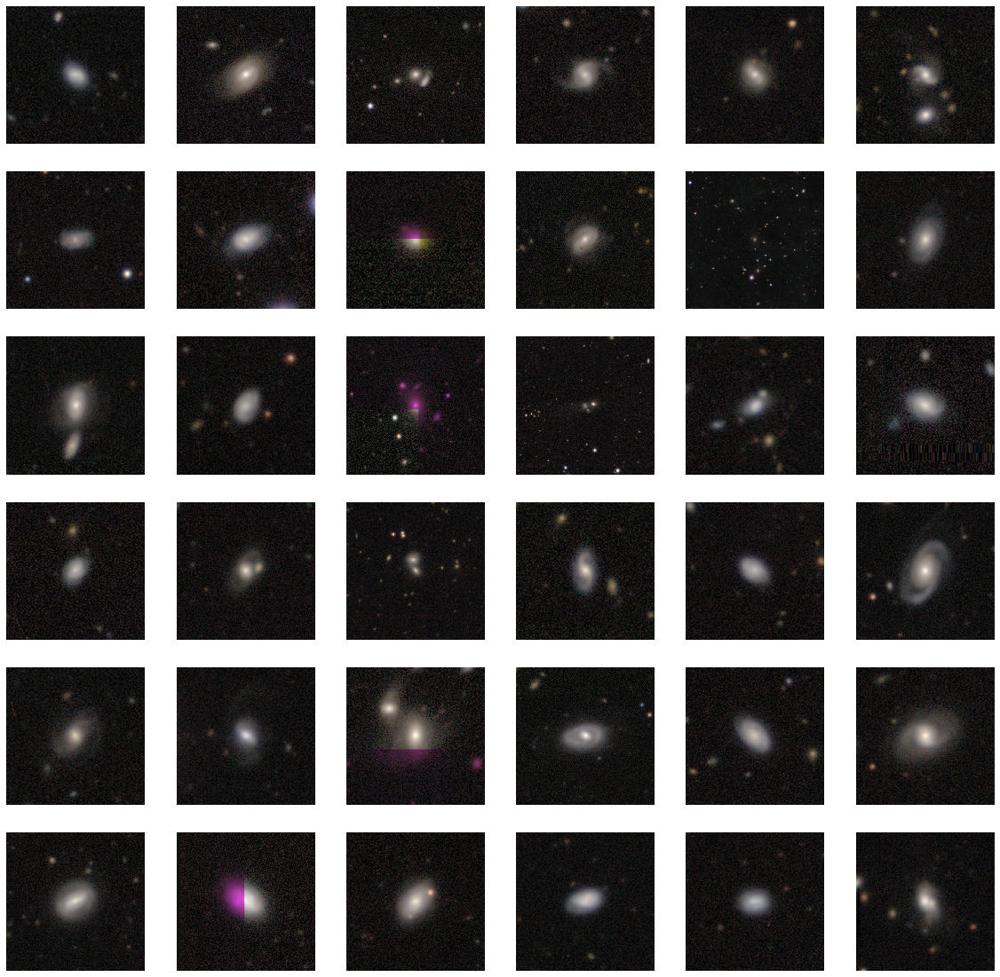

In [79]:
show_galaxies(df_X.sort_values('gp_std'))

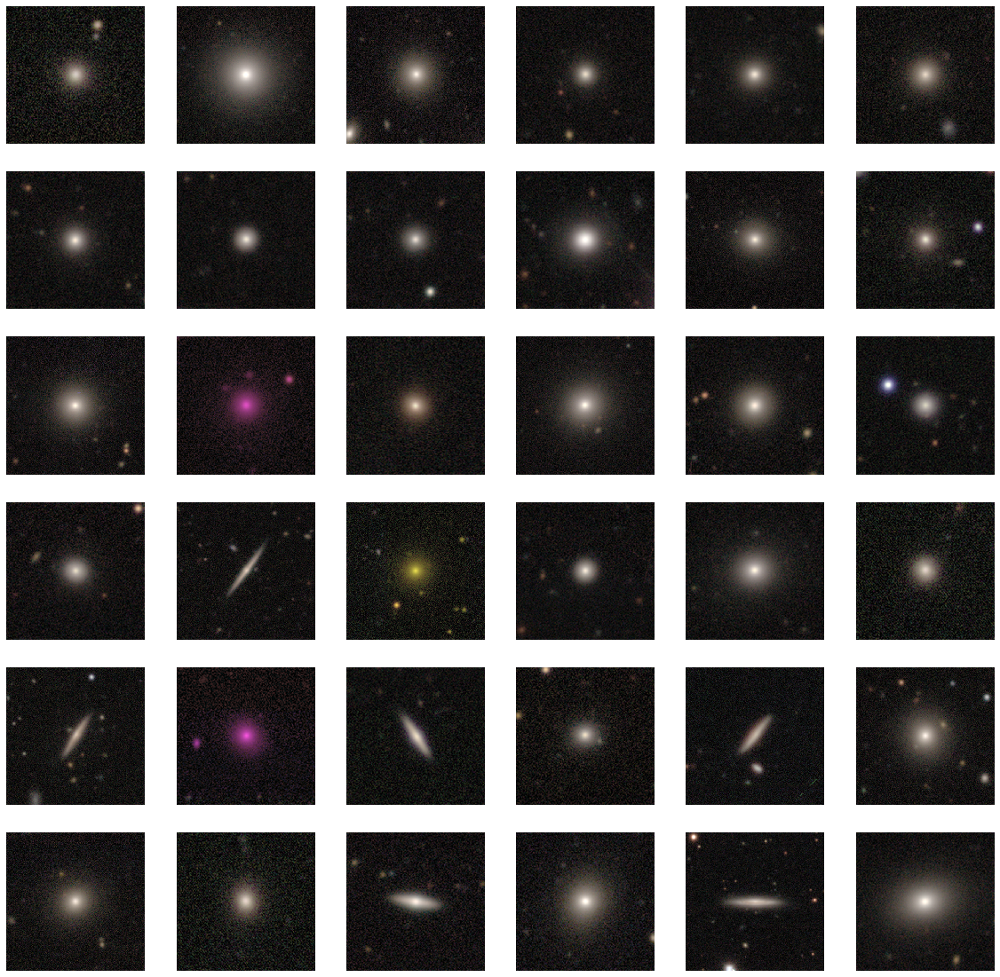

In [80]:
show_galaxies(df_X.sort_values('gp_std', ascending=False))

Looks good, add more dimensions

In [13]:
max_galaxies = 10000

In [30]:
feature_df = pd.read_parquet('dr5_8_b0_pca10_and_safe_ids.parquet')
feature_df = feature_df[feature_df['galaxy_id'].str.startswith('J')][:max_galaxies]

In [54]:
label_df = pd.read_csv('embedding_index_and_labels_911k.csv')

In [56]:
feature_labels_X = pd.merge(feature_df, label_df, on='galaxy_id', how='inner')
assert len(feature_labels_X) == len(feature_df)

In [57]:
labels = np.array(feature_labels_X['interesting'].astype(int) - feature_labels_X['not_interesting'].astype(int))[feature_labels_X['labelled']]

In [31]:
feature_cols = [col for col in feature_df.columns.values if col.startswith('feat_')]

In [62]:
X = feature_labels_X[feature_cols].values
X_labelled = X[feature_labels_X['labelled']]


In [63]:
X.shape, X_labelled.shape, labels.shape

((10000, 10), (1194, 10), (1194,))

In [61]:

kernel = Matern() + WhiteKernel()  #  additional parameter which controls the smoothness

gpr = GaussianProcessRegressor(kernel=kernel, random_state=0).fit(X_labelled, labels)
gpr.score(X_labelled, labels)


In [64]:
preds, std = gpr.predict(X, return_std=True)

In [65]:
feature_labels_X['gp_pred'] = preds
feature_labels_X['gp_std'] = std

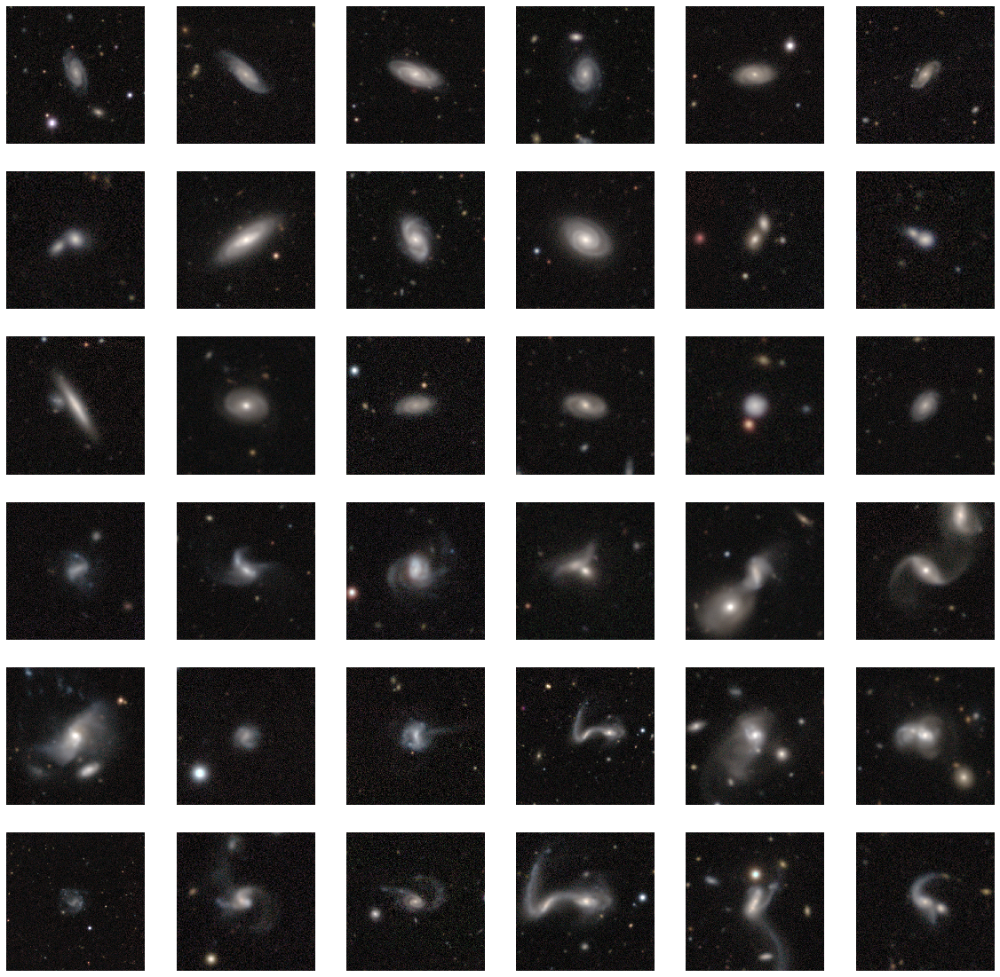

In [67]:
feature_df_unlabelled = feature_labels_X[~feature_labels_X['labelled']]

show_galaxies(pd.concat([feature_df_unlabelled.sort_values('gp_pred')[:18], feature_df_unlabelled.sort_values('gp_pred')[-18:]]))

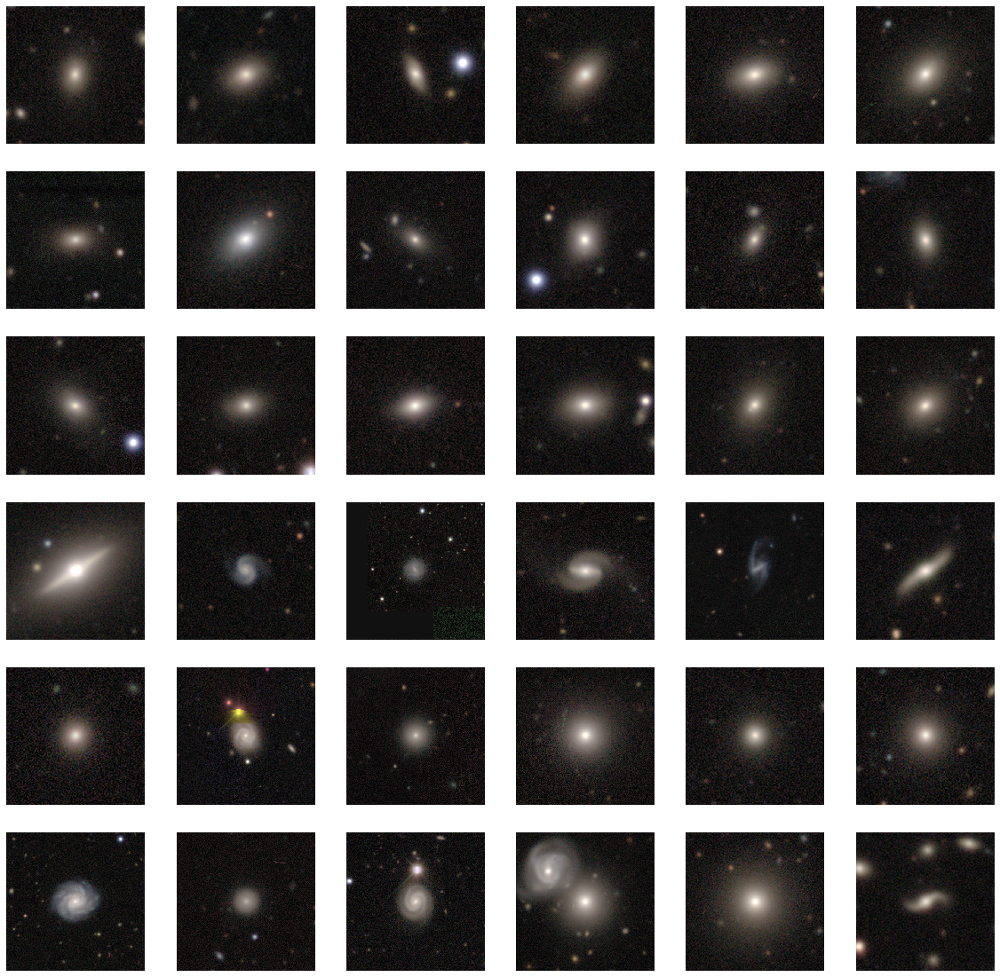

In [68]:
show_galaxies(pd.concat([feature_df_unlabelled.sort_values('gp_std')[:18], feature_df_unlabelled.sort_values('gp_std')[-18:]]))

In [42]:
# show_galaxies(pd.concat([df_X.sort_values('gp_pred')[:18], df_X.sort_values('gp_pred')[-18:]]))

In [59]:
# show_galaxies(pd.concat([df_X.sort_values('gp_std')[:18], df_X.sort_values('gp_std')[-18:]]))

In [60]:
# def n_tabs_to_comma(line):
#     return line.replace('\t\t\t', ', ').replace('\t\t', ', ').replace('\t', ', ')  # bit hacky, does the job

In [61]:
# target_list_txt = '/home/walml/Downloads/ZooGemslist.txt'
# target_list_csv = target_list_txt.replace('.txt', '.csv')

# with open(target_list_txt, 'r') as f:
#     lines = f.readlines()
# with open(target_list_csv, 'w') as f:
#     for line in lines:
#         if line != '\n':
#             f.write(n_tabs_to_comma(line))

In [62]:
# you probably want to omit Green Peas since they don't have SDSS structure, and some of the RGZ objects are pretty faint. 

In [69]:
# needed a little further manual formatting
gems = pd.read_csv('/home/walml/Downloads/ZooGemslist_manually_parsed.csv')

In [70]:
gems

,Dataset,Target Name,Type,RA (J2000),Dec (J2000),Start Time,Stop Time,Exp Time,Filter 1,Filter 2
0,JDS45H010,SDSS-091949.07+135910.7,SDRAGN,09 19 47.195,+13 58 22.68,2018/05/15 21:49:55,2018/05/15 22:03:52,674.0,F475W,NaN
1,JDS43Y010,UGC-1797,SDRAGN,02 19 58.728,+01 55 48.72,2018/07/03 02:46:37,2018/07/03 03:00:34,674.0,F475W,NaN
2,JDS452010,SDSS-170414.33+620234.0,3-arm,17 04 16.225,+62 02 57.91,2018/07/06 08:19:20,2018/07/06 08:33:18,674.0,F475W,NaN
3,JDS42MO4Q,SDSS-1237651537646977181,2-filter Pea,15 04 57.987,+59 54 07.27,2018/07/10 14:11:15,2018/07/10 14:16:54,337.0,F555W,NaN
4,JDS42MO5Q,SDSS-1237651537646977181,2-filter Pea,15 04 57.987,+59 54 07.27,2018/07/10 14:19:40,2018/07/10 14:25:18,337.0,F850LP,NaN
...,...,...,...,...,...,...,...,...,...,...
116,JDS444010,CGCG-396-002,Merger,05 37 35.976,+01 20 04.20,2021/03/18 22:36:26,2021/03/18 22:50:23,674.0,F606W,NaN
117,JDS46W010,SDSS-083512.43+175441.0,RGZ Green,08 35 10.668,+17 53 50.09,2021/03/19 01:55:27,2021/03/19 02:09:24,674.0,F625W,NaN
118,JDS47D010,SDSS-123300.30+060326.1,RGZ HyMor,12 32 58.539,+06 04 16.38,2021/03/21 08:13:26,2021/03/21 08:27:23,674.0,F625W,NaN
119,JDS476010,VCC-1711,Post-starburst,12 37 22.147,+12 17 13.32,2021/03/21 19:20:48,2021/03/21 19:34:45,674.0,F475W,NaN


In [71]:
gems.columns.values

array(['Dataset', 'Target Name', 'Type', 'RA (J2000)', 'Dec (J2000)',
       'Start Time', 'Stop Time', 'Exp Time', 'Filter 1', 'Filter 2'],
      dtype=object)

In [72]:
from astropy.coordinates import SkyCoord, match_coordinates_sky
# https://docs.astropy.org/en/stable/coordinates/
from astropy import units as u

In [73]:
SkyCoord('00 42 30 +41 12 00', unit=(u.hourangle, u.deg))

<SkyCoord (ICRS): (ra, dec) in deg
    (10.625, 41.2)>

In [74]:
# SkyCoord(gems.iloc[0]['RA (J2000)'] + gems.iloc[0]['Dec (J2000)'], )

In [75]:
gems['coordinates_str'] = gems[['RA (J2000)', 'Dec (J2000)']].apply(lambda x: ' '.join(x), axis=1)
gems['coordinates'] = gems['coordinates_str'].apply(lambda x: SkyCoord(x, unit=(u.hourangle, u.deg)))

In [76]:
gems['ra'] = gems['coordinates'].apply(lambda x: x.ra.degree)
gems['dec'] = gems['coordinates'].apply(lambda x: x.dec.degree)

In [77]:
gems['ra'][:5], gems['dec'][:5]

(0    139.946646
 1     34.994700
 2    256.067604
 3    226.241612
 4    226.241612
 Name: ra, dtype: float64,
 0    13.972967
 1     1.930200
 2    62.049419
 3    59.902019
 4    59.902019
 Name: dec, dtype: float64)

In [79]:
# decals = pd.read_parquet('../zoobot_private/gz_decals_auto_posteriors.parquet', columns=['ra', 'dec', 'iauname'])
# decals = pd.read_csv('/home/walml/repos/zoobot_private/decals_dr5_uploadable_master_catalog_nov_2019.csv')
decals = pd.read_parquet('dr5_dr8_catalog_with_radius.parquet')

In [80]:
decals

,iauname,ra,dec,petro_theta,petro_th50,petro_th90,elpetro_absmag_r,sersic_nmgy_r,mag_r,png_loc,estimated_radius,galaxy_id,filename,objid,weighted_radius,dr8_id
0,J000001.03+003228.7,0.004367,0.541321,3.932198,1.713884,5.177910,-19.840881,80.937607,17.729624,/media/walml/beta1/decals/png_native/dr5/J000/...,1.713884,J000001.03+003228.7,None,None,NaN,None
1,J000001.55-000533.3,0.006467,-0.092602,4.453663,1.874217,6.210364,-20.148724,228.083923,16.604763,/media/walml/beta1/decals/png_native/dr5/J000/...,1.874217,J000001.55-000533.3,None,None,NaN,None
2,J000001.85+004309.3,0.007754,0.719249,3.518912,1.571225,4.458132,-19.893991,138.997864,17.142479,/media/walml/beta1/decals/png_native/dr5/J000/...,1.571225,J000001.85+004309.3,None,None,NaN,None
3,J000002.29-042805.0,0.009930,-4.467797,7.391881,3.475287,8.345883,-21.630848,373.022644,16.070662,/media/walml/beta1/decals/png_native/dr5/J000/...,3.475287,J000002.29-042805.0,None,None,NaN,None
4,J000002.70+081756.0,0.010619,8.298132,4.769954,2.060995,6.721991,-19.855255,764.498718,15.291557,/media/walml/beta1/decals/png_native/dr5/J000/...,2.060995,J000002.70+081756.0,None,None,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911437,None,31.304910,-44.332391,NaN,NaN,NaN,NaN,NaN,NaN,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,2.296900,99997_707,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,99997_707,2.296900,99997_707
911438,None,31.625509,-44.175625,NaN,NaN,NaN,NaN,NaN,NaN,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,2.718789,99998_3298,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,99998_3298,2.718789,99998_3298
911439,None,31.889396,-44.355286,NaN,NaN,NaN,NaN,NaN,NaN,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,4.661195,99999_396,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,99999_396,4.661195,99999_396
911440,None,31.705445,-44.153415,NaN,NaN,NaN,NaN,NaN,NaN,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,2.461527,99999_3961,/raid/scratch/walml/galaxy_zoo/decals/dr8_down...,99999_3961,2.461527,99999_3961


In [95]:
# catalog_coordinates = decals[['ra', 'dec']].apply(lambda x: SkyCoord(*x, unit='deg'), axis=1)

In [86]:
from shared_astro_utils.matching_utils import match_galaxies_to_catalog_pandas

matched, unmatched = match_galaxies_to_catalog_pandas(gems, decals, matching_radius=10 * u.arcsec, galaxy_suffix='_subject', catalog_suffix='')
len(matched), len(unmatched)

(6, 115)

In [87]:
matched['filename'] = matched['png_loc'].str.replace('/Volumes/alpha', '/media/walml/beta1')

In [88]:
matched

,Dataset,Target Name,Type,RA (J2000),Dec (J2000),Start Time,Stop Time,Exp Time,Filter 1,Filter 2,...,elpetro_absmag_r,sersic_nmgy_r,mag_r,png_loc,estimated_radius,galaxy_id,filename,objid,weighted_radius,dr8_id
0,JDS474010,SDSS-124354.11+163250.5,PSB galaxy,12 43 54.178,+16 32 50.85,2019/03/19 13:30:53,2019/03/19 13:44:50,674.0,F475W,NaN,...,-14.193285,200.545868,16.744465,/media/walml/beta1/decals/png_native/dr5/J124/...,6.581573,J124354.11+163250.5,/media/walml/beta1/decals/png_native/dr5/J124/...,None,NaN,None
1,JDS418010,GAMA70579,Ringed galaxy,12 01 43.464,+00 10 59.16,2019/05/17 06:34:36,2019/05/17 06:48:33,674.0,F606W,NaN,...,-19.418928,78.805191,17.758614,/media/walml/beta1/decals/png_native/dr5/J120/...,6.080634,J120143.46+001059.2,/media/walml/beta1/decals/png_native/dr5/J120/...,None,NaN,None
2,JDS428010,SDSS-095346.77-012746.1,Interaction,09 53 46.680,-01 27 45.00,2020/03/03 05:50:45,2020/03/03 06:04:42,674.0,F606W,NaN,...,-21.431871,152.124344,17.044502,/media/walml/beta1/decals/png_native/dr5/J095/...,5.593759,J095346.50-012744.9,/media/walml/beta1/decals/png_native/dr5/J095/...,None,NaN,None
3,JDS457010,UGCA-188,Poststarburst,09 55 29.700,+08 23 26.28,2020/06/12 20:44:08,2020/06/12 20:58:05,674.0,F475W,NaN,...,-16.319796,1604.917236,14.486368,/media/walml/beta1/decals/png_native/dr5/J095/...,11.725840,J095529.39+082326.9,/media/walml/beta1/decals/png_native/dr5/J095/...,None,NaN,None
4,JDS427010,SDSS-081740.08+042952.3,Polar ring,08 17 40.080,+04 29 52.44,2021/01/12 21:07:04,2021/01/12 21:21:01,674.0,F606W,NaN,...,-20.974287,165.806396,16.950996,/media/walml/beta1/decals/png_native/dr5/J081/...,3.384780,J081740.08+042952.3,/media/walml/beta1/decals/png_native/dr5/J081/...,None,NaN,None
5,JDS47K010,SDSS-113648.57+125239.7,SDRAGN,11 36 48.57,+12 52 39.7,2021/03/14 02:58:57,2021/03/14 03:12:54,674.0,F475W,NaN,...,-18.142628,172.234116,16.909702,/media/walml/beta1/decals/png_native/dr5/J113/...,4.050050,J113648.57+125239.7,/media/walml/beta1/decals/png_native/dr5/J113/...,None,NaN,None


In [89]:
matched['iauname']

0    J124354.11+163250.5
1    J120143.46+001059.2
2    J095346.50-012744.9
3    J095529.39+082326.9
4    J081740.08+042952.3
5    J113648.57+125239.7
Name: iauname, dtype: object

In [94]:
puzzling = unmatched.query('ra > 100').query('ra < 270').query('dec < 30').query('dec > - 10')

Text(0, 0.5, 'Dec')

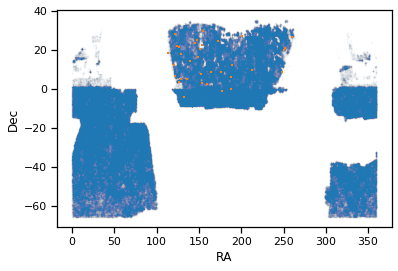

In [95]:
plt.scatter(decals['ra'], decals['dec'], alpha=0.01, s=.5)
# plt.scatter(gems['ra'], gems['dec'], marker='+', s=4)
plt.scatter(puzzling['ra'], puzzling['dec'], marker='+', s=4)
plt.xlabel('RA')
plt.ylabel('Dec')

In [103]:
puzzling['Type'].value_counts()

SDRAGN              9
2-filter Pea        8
Green Pea           5
RGZGreen            2
RGZ Green           2
SDRAGN              1
RGZ HyMor           1
Overlap             1
Merger; RGZ?        1
Post-starburst      1
CollisionalRing     1
Blue E              1
Pea                 1
Green Pea           1
Regrowing disk      1
Asymm spiral        1
Poststarburst       1
Name: Type, dtype: int64

In [100]:
matched[['ra', 'dec']]

,ra,dec
0,190.975458,16.547361
1,180.431121,0.183135
2,148.444464,-1.462529
3,148.873941,8.390971
4,124.417040,4.497872
5,174.202431,12.877834


IndexError: single positional indexer is out-of-bounds

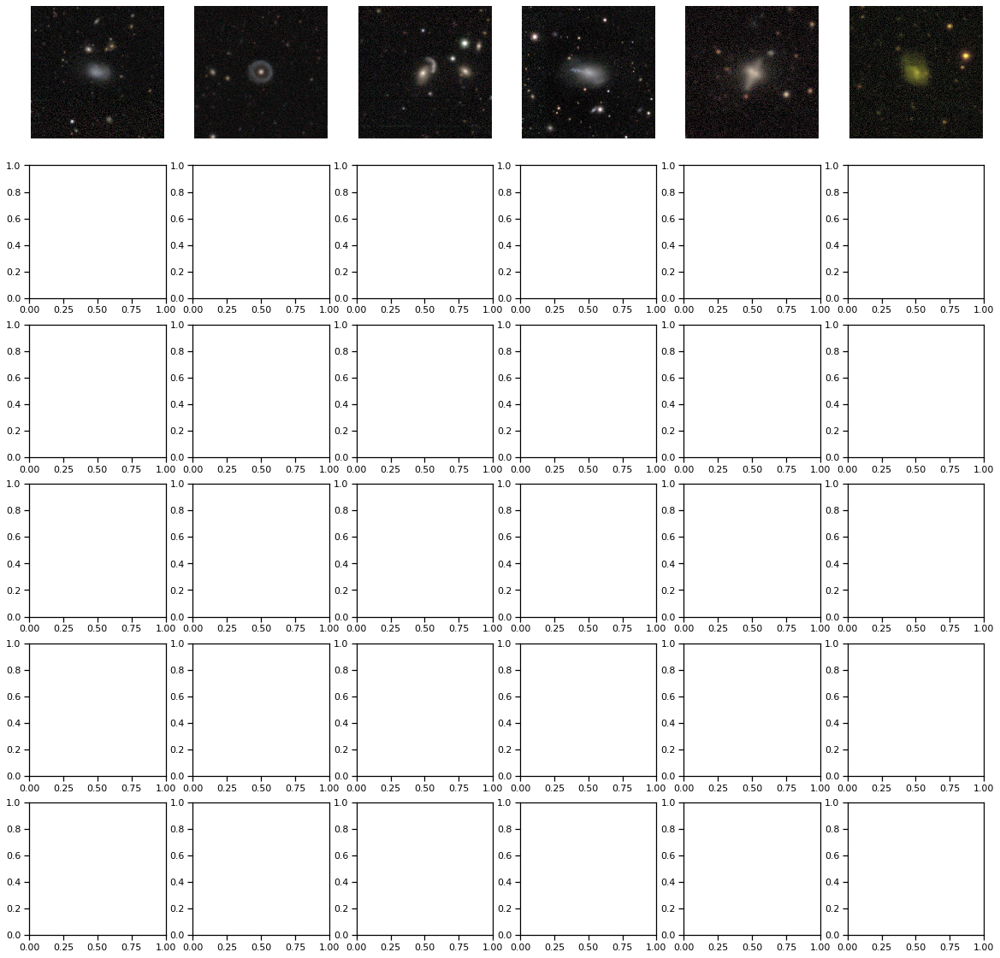

In [90]:
show_galaxies(matched)  # 1 and 3 are post-starburst and in decals, blue smudge type